In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.13.0.post200
1.9.1


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [6]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"best_ALL_1130_continue.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [7]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [8]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [9]:
## GRN for the transition t1 to t3
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 2).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast
Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [10]:
# Save the array to disk
np.save('genesys_ctw_t1-t3.npy', ctw)

In [11]:
ctw = np.load('genesys_ctw_t1-t3.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: Name, dtype: int64

## Network analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [18]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

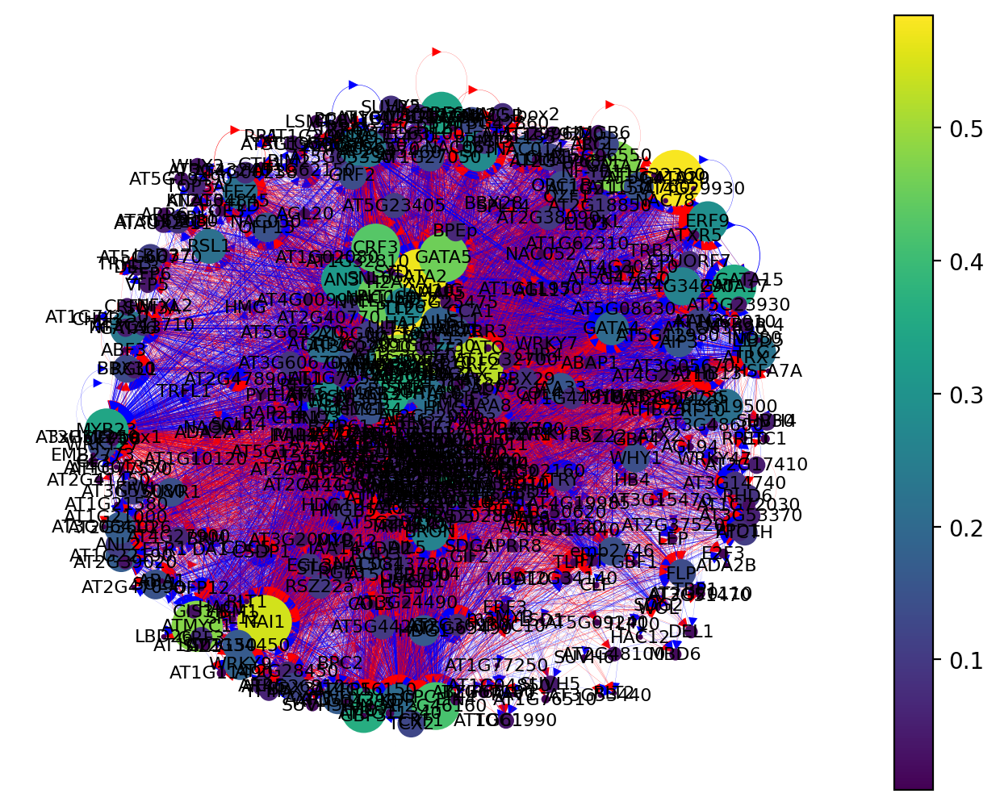

In [19]:
atri = network(0)

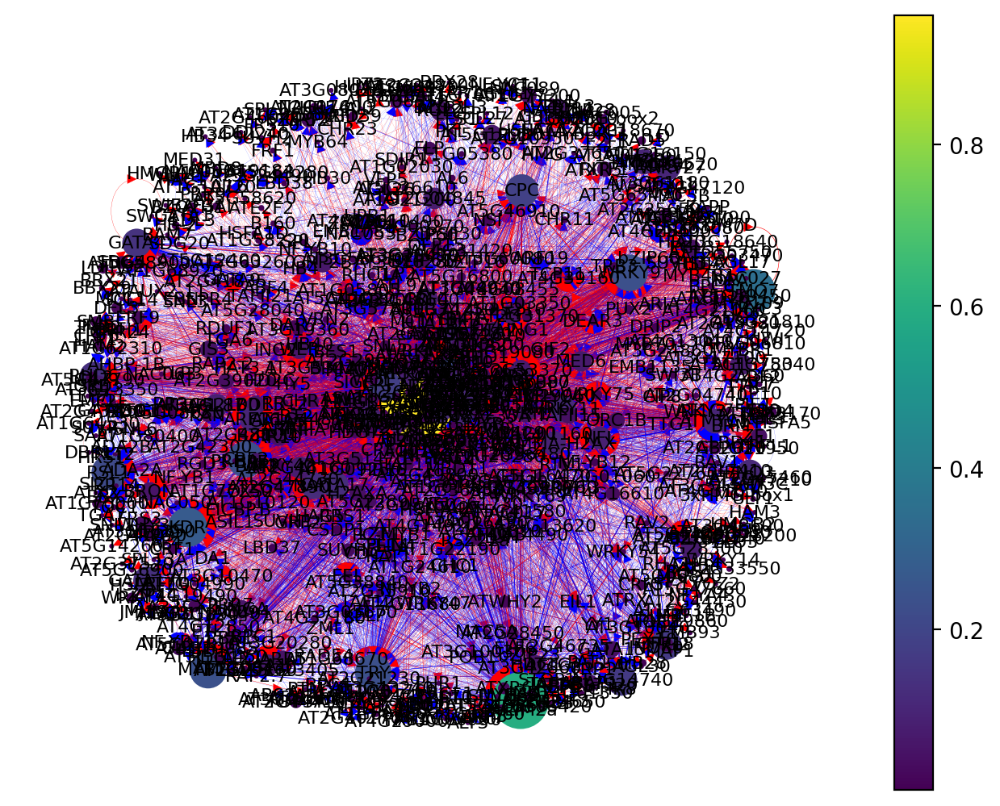

In [20]:
tri = network(1)

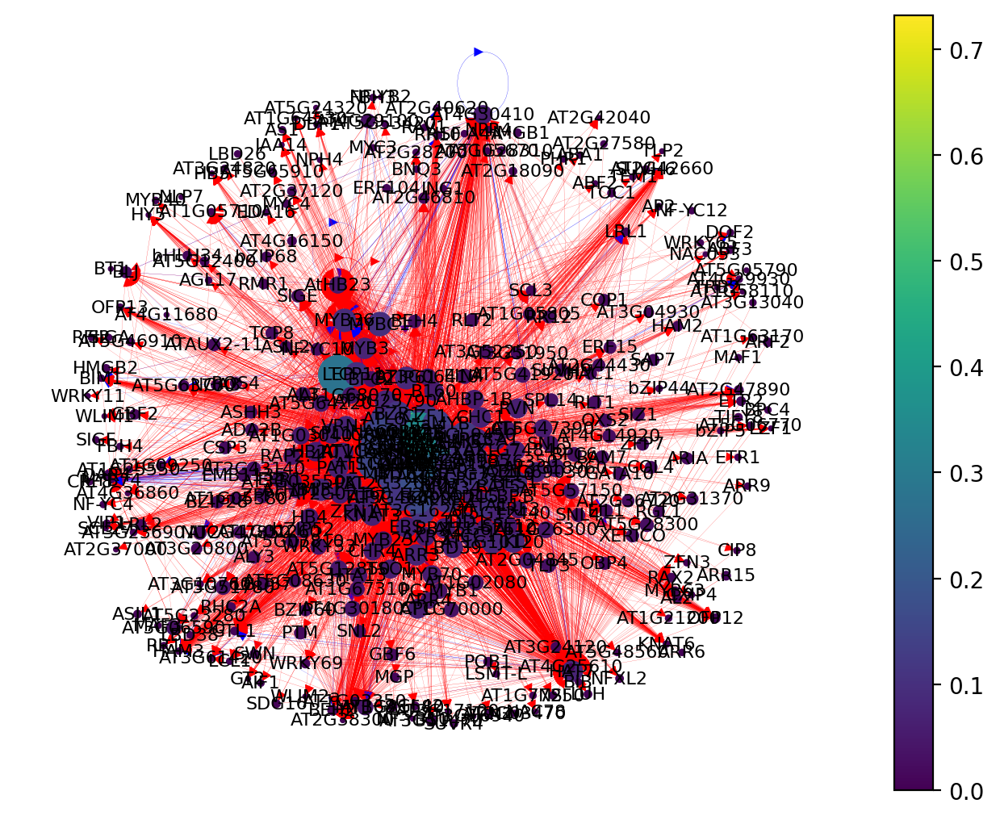

In [21]:
cor = network(2)

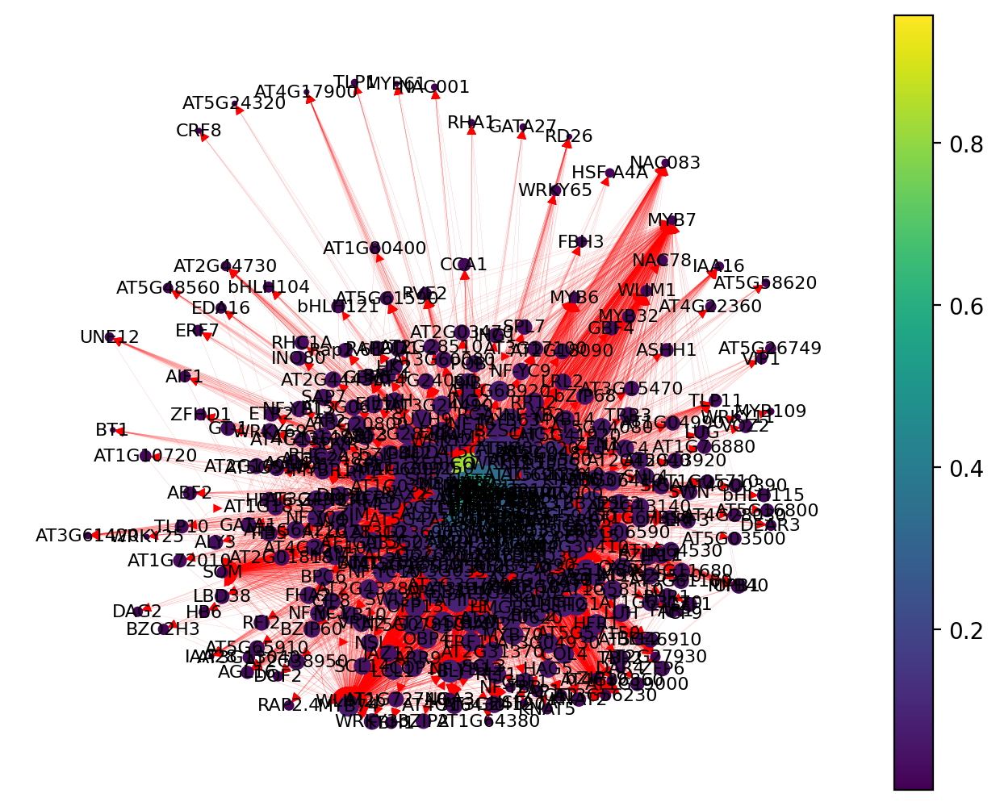

In [22]:
end = network(3)

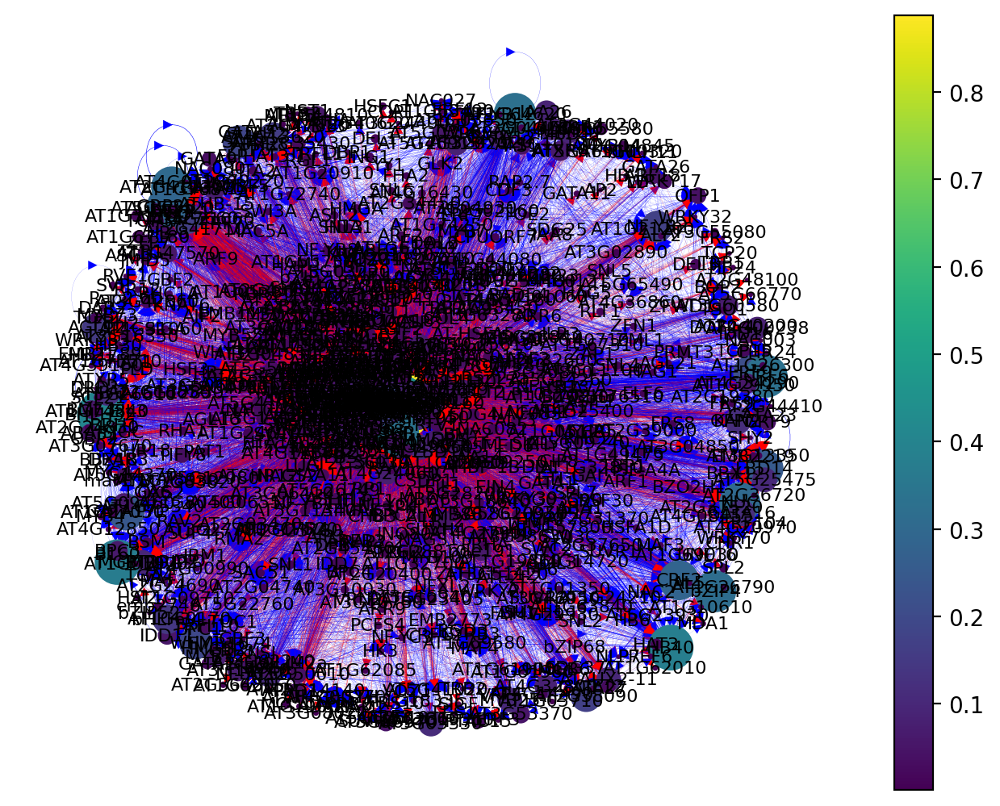

In [23]:
per = network(4)

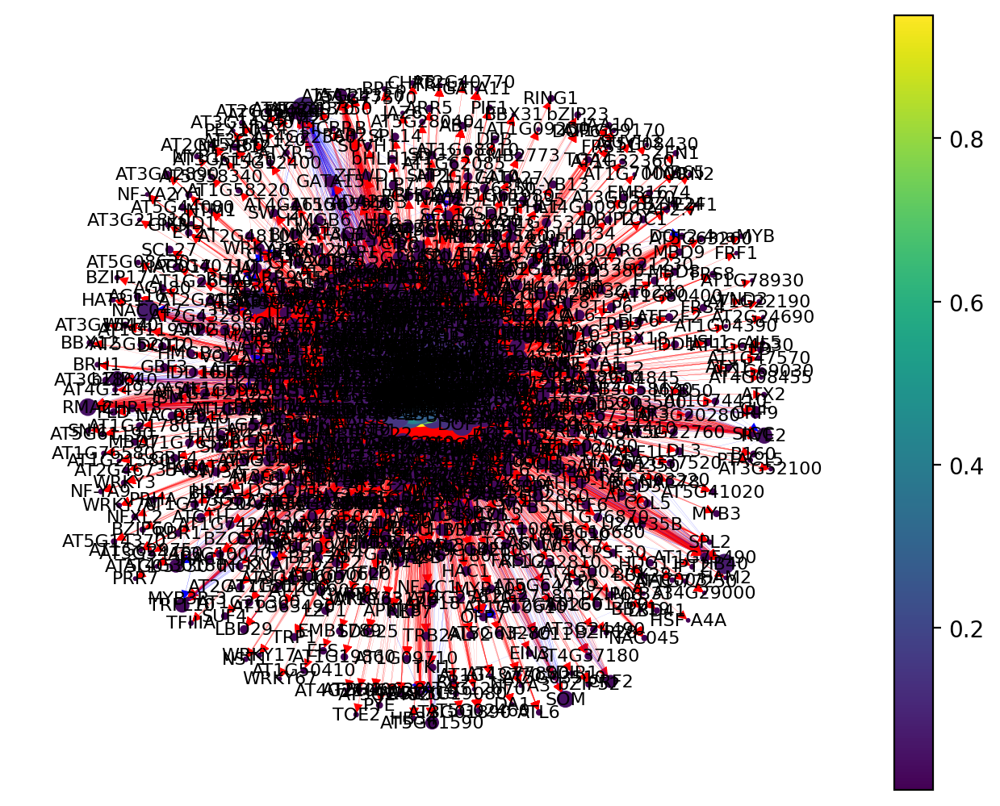

In [24]:
pro = network(5)

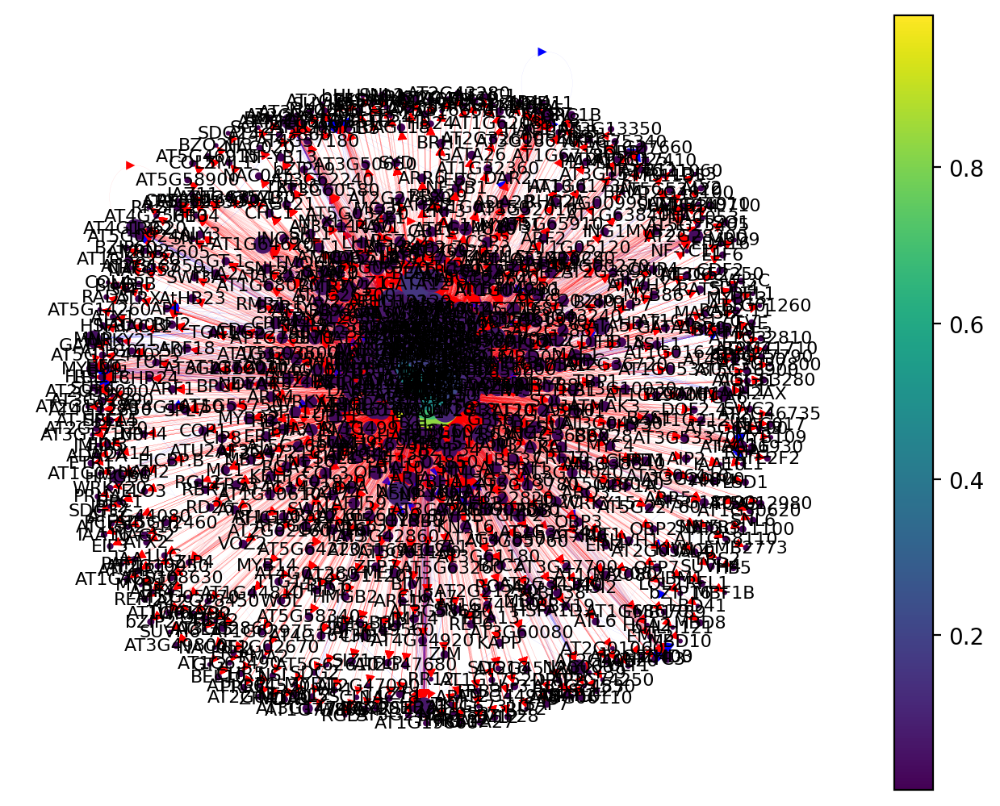

In [25]:
xyl = network(6)

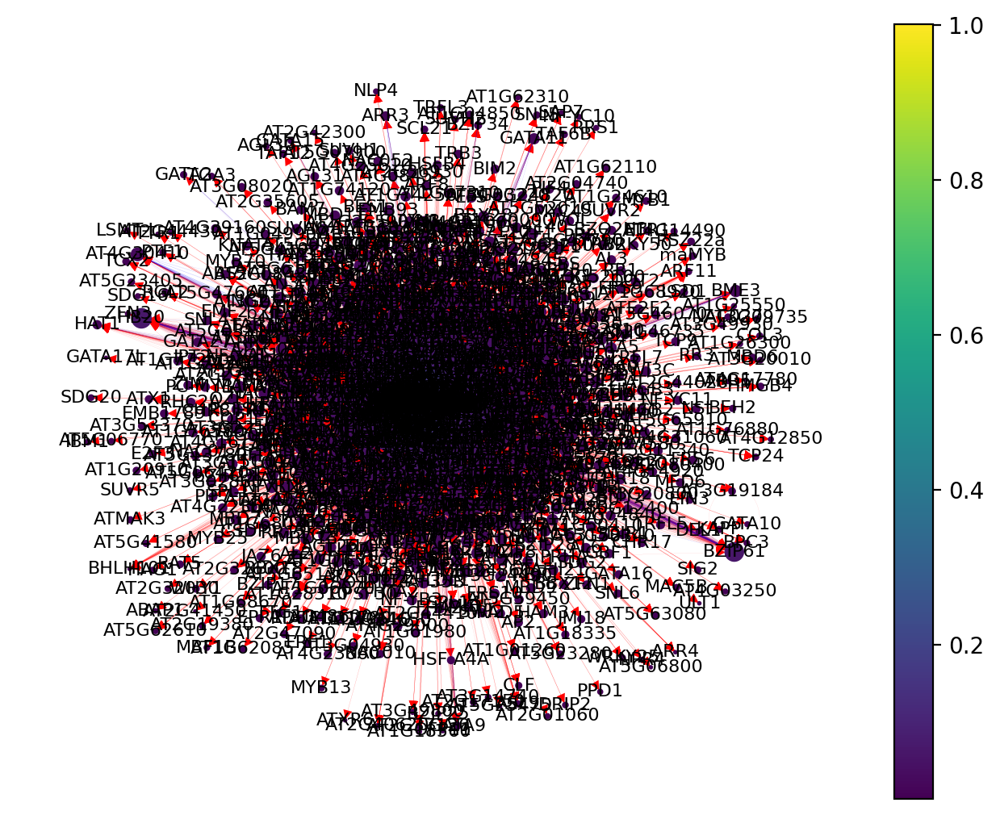

In [26]:
phl = network(7)

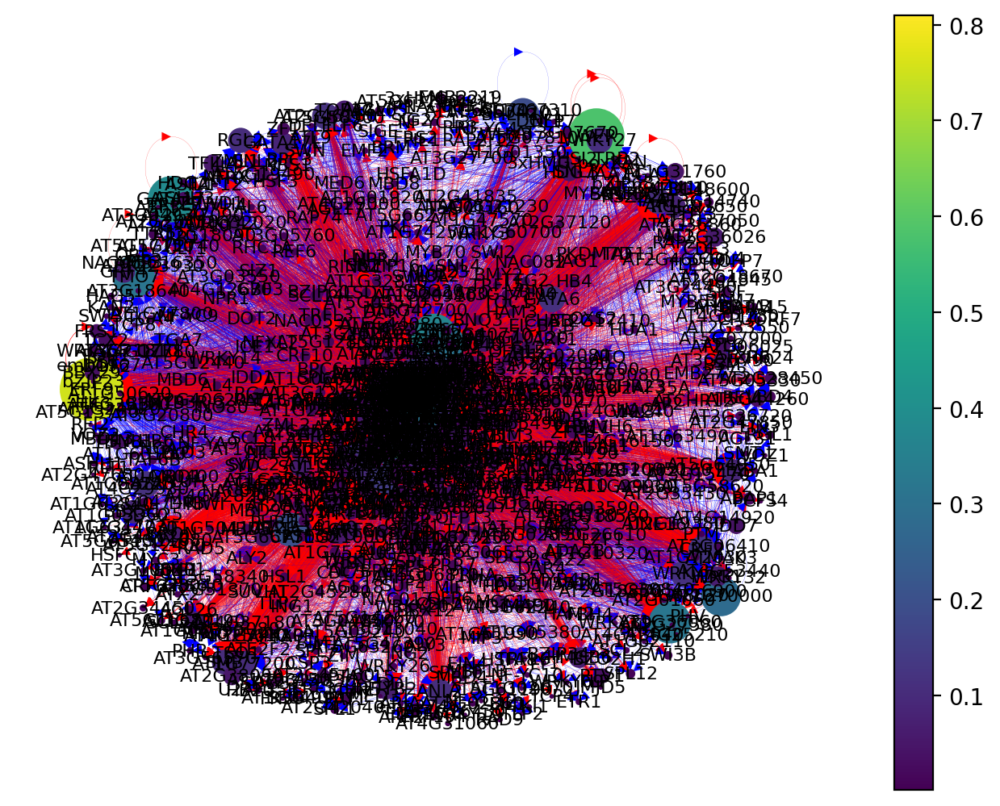

In [27]:
lrc = network(8)

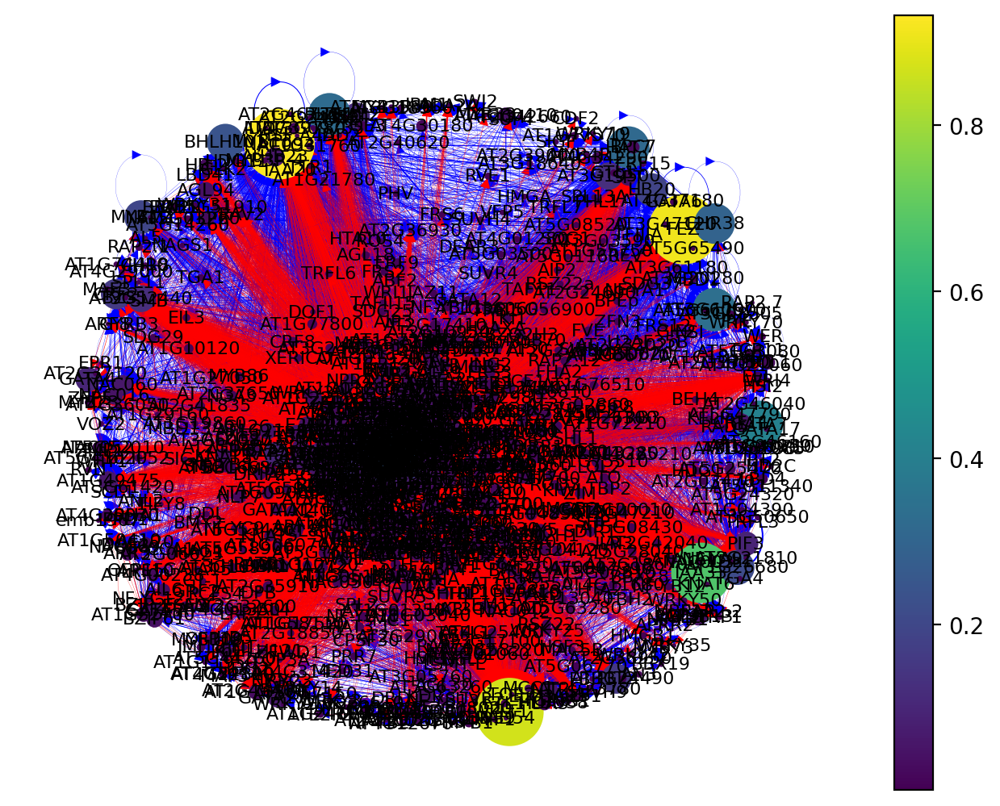

In [28]:
col = network(9)

In [29]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [30]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts(), columns=['tf_occurance'])
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [31]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
WRKY9,0.948657,0.615222,0.932734,0.184314,0.235294,0.226682,0.500000,0.135027,0.316411,9,13.094342
ATS,0.932748,0.488213,0.852591,0.201961,0.098930,0.110980,0.562745,0.140374,0.329398,9,12.717940
GL2,0.918236,0.703726,0.472882,0.349020,0.594920,0.031877,0.411765,0.108289,0.020071,9,12.610785
LBD15,0.860780,0.334223,0.173497,0.158824,0.056150,0.550177,0.343137,0.133690,0.351830,9,11.962307
AT1G36060,0.550021,0.053925,0.459932,0.431373,0.247326,0.318772,0.162745,0.046791,0.232586,9,11.503472
GATA17,0.895543,0.002348,0.299921,0.352941,0.122995,0.383707,0.247059,0.010695,0.152302,9,11.467511
TTG2,0.851296,0.436699,0.085448,0.225490,0.165775,0.008264,0.331373,0.088235,0.011806,9,11.204388
ANL2,0.762518,0.015663,0.565964,0.107843,0.040107,0.106257,0.145098,0.084225,0.247934,9,11.075609
BNQ3,0.852918,0.530122,0.049549,0.070588,0.110963,0.011806,0.239216,0.052139,0.011806,9,10.929108
CRF4,0.896868,0.220560,0.048572,0.249020,0.080214,0.036600,0.290196,0.048128,0.017710,9,10.887867


In [32]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
ATMYC1,0.486764,0.744150,0.478431,0.101604,0.052941,0.296791,6,8.160682
RHD6,0.633746,0.623598,0.090196,0.135027,0.047059,0.211230,6,7.740855
TRY,0.792453,0.237884,0.090196,0.233957,0.221569,0.037433,6,7.613492
IAA14,0.863658,0.296280,0.029412,0.143048,0.192157,0.076203,6,7.600758
EGL3,0.449728,0.348768,0.094118,0.040107,0.031373,0.101604,6,7.065697
HMGB5,0.523895,0.000002,0.096078,0.042781,0.188235,0.012032,6,6.863024
AT5G12980,0.001957,0.021781,0.052941,0.058824,0.160784,0.017380,6,6.313666
OFP18,0.057221,0.001510,0.027451,0.029412,0.127451,0.022727,6,6.265772


In [33]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
NF-YC13,0.273319,0.050980,0.062745,3,3.387045
FVE,0.118510,0.121569,0.100000,3,3.340079
SUVR1,0.091806,0.141176,0.017647,3,3.250630
PS1,0.077106,0.135294,0.027451,3,3.239851
HDG7,0.074001,0.098039,0.064706,3,3.236746
GRF3,0.054644,0.080392,0.064706,3,3.199742
OFP15,0.018217,0.149020,0.105882,3,3.273119
HDG1,0.010139,0.164706,0.043137,3,3.217982
AT3G56570,0.008552,0.233333,0.050980,3,3.292866
PRMT3,0.001876,0.088235,0.101961,3,3.192072


In [34]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
TAFII15,0.528436,0.040107,0.028075,3,3.596618
AT2G37120,0.439641,0.049465,0.176471,3,3.665577
RSL1,0.398866,0.216578,0.117647,3,3.733091
WRKY75,0.303063,0.010695,0.224599,3,3.538357
AT4G39160,0.288006,0.009358,0.171123,3,3.468487
MED6,0.278431,0.065508,0.050802,3,3.394741
ZF1,0.158022,0.040107,0.042781,3,3.240910
LRL3,0.126848,0.001337,0.164439,3,3.292623
WRKY42,0.039010,0.016043,0.021390,3,3.076443
RSL4,0.038342,0.006684,0.250000,3,3.295027


In [35]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
TFIIIA,0.632137,0.054309,0.059032,3,3.745478
AT1G70000,0.380033,0.279811,0.059032,3,3.718876
PPD1,0.242391,0.024793,0.042503,3,3.309687
LBD41,0.219469,0.044864,0.023613,3,3.287946
WRKY35,0.084745,0.016529,0.034238,3,3.135512
DAR7,0.062212,0.008264,0.022432,3,3.092909
AT3G05670,0.055438,0.009445,0.018890,3,3.083774
AT5G64220,0.039459,0.038961,0.029516,3,3.107936
GRF2,0.037020,0.070838,0.037780,3,3.145638
AT1G19000,0.033417,0.090909,0.022432,3,3.146758


In [36]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
NAC042,0.853618,0.009249,0.205780,3,4.068647
PIF3,0.152002,0.094798,0.143353,3,3.390152
CRF11,0.079147,0.048555,0.038150,3,3.165852
SPL14,0.022550,0.171098,0.107514,3,3.301163
COL5,0.020871,0.106358,0.316763,3,3.443992
TLP7,0.017514,0.270520,0.126012,3,3.414045
TGA7,0.015615,0.093642,0.077457,3,3.186713
NAC052,0.008074,0.020809,0.154913,3,3.183796
FBH4,0.005778,0.024277,0.092486,3,3.122541
AT1G21580,0.005743,0.041618,0.098266,3,3.145627


In [37]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
MYB36,0.787439,0.118912,0.090395,0.215633,0.279661,1.002695,6,8.494736
MYB3,0.519150,0.059532,0.073446,0.212938,0.096045,0.975741,6,7.936853
MYB74,0.306885,0.075297,0.002825,0.072776,0.180791,0.943396,6,7.581970
MYB68,0.225300,0.078866,0.039548,0.172507,0.064972,0.905660,6,7.486854
BLJ,0.040156,0.362024,0.019774,0.086253,0.042373,0.770889,6,7.321470
AT1G72210,0.018598,0.000197,0.104520,0.239892,0.285311,0.056604,6,6.705121
AT5G59450,0.002369,0.000845,0.124294,0.129380,0.011299,0.358491,6,6.626678
APRR2,0.006850,0.000146,0.110169,0.169811,0.050847,0.035040,6,6.372864
SCL3,0.000016,0.000087,0.014124,0.059299,0.019774,0.226415,6,6.319716
RR3,0.000008,0.000175,0.087571,0.121294,0.042373,0.013477,6,6.264897


In [38]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
AT2G38300,0.001584,0.002825,0.491525,3,3.495935
EIL1,0.000120,0.025424,0.124294,3,3.149838


In [39]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
BIB,0.240286,0.061995,0.328841,3,3.631121
HSFB4,0.183747,0.477089,0.053908,3,3.714745
AN3,0.093538,0.549865,0.056604,3,3.700007
FAR1,0.045655,0.032345,0.005391,3,3.083390
RVN,0.015400,0.145553,0.061995,3,3.222947
...,...,...,...,...,...
GBF1,0.000007,0.048518,0.010782,3,3.059306
ABF3,0.000007,0.051213,0.016173,3,3.067393
AT3G17100,0.000007,0.037736,0.053908,3,3.091651
HFR1,0.000007,0.056604,0.005391,3,3.062002


In [40]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G43430,0.786389,0.797947,0.000011,0.229851,0.447073,0.367698,0.144089,0.856130,0.788294,0.930126,0.118227,0.924012,12,18.389846
MYB20,0.720003,0.828776,0.001622,0.122188,0.287671,0.710195,0.152709,0.255319,0.464508,0.785796,0.162562,0.055724,12,16.547073
DAG1,0.359877,0.058652,0.000027,0.017665,0.211706,0.328751,0.082512,0.544073,0.293898,0.738832,0.025862,0.621074,12,15.282929
HB40,0.231353,0.602280,0.234036,0.076906,0.376090,0.065292,0.167488,0.189463,0.042341,0.032073,0.133005,0.720365,12,14.870692
AT1G64620,0.312489,0.003954,0.830570,0.000075,0.325031,0.066438,0.052956,0.059777,0.093400,0.014891,0.039409,0.048632,12,13.847622
TCP14,0.467702,0.052274,0.001479,0.000181,0.077210,0.192440,0.131773,0.238095,0.024907,0.321879,0.087438,0.173252,12,13.768631
SGR5,0.000003,0.952535,0.000079,0.000020,0.070984,0.142039,0.131773,0.021277,0.009963,0.130584,0.065271,0.187437,12,13.711964
AT2G29660,0.016720,0.020035,0.705398,0.000012,0.102117,0.169530,0.141626,0.151976,0.048568,0.122566,0.110837,0.111449,12,13.700834
AT5G50010,0.704723,0.000914,0.001192,0.000010,0.042341,0.156930,0.211823,0.131712,0.148194,0.140893,0.115764,0.037487,12,13.691985
AT1G69580,0.004548,0.000422,0.000012,0.000187,0.029888,0.154639,0.094828,0.387031,0.141968,0.290951,0.084975,0.451874,12,13.641323


In [41]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT3G21330,0.821422,0.254047,0.087173,3,4.162643
LBD14,0.768766,0.251557,0.191781,3,4.212104
GATA23,0.710124,0.053549,0.146949,3,3.910622
AT2G20100,0.578906,0.240349,0.134496,3,3.953750
IDD11,0.555840,0.053549,0.214197,3,3.823585
AT2G14880,0.445789,0.085928,0.093400,3,3.625117
MGP,0.435397,0.371108,0.099626,3,3.906131
AT2G35430,0.090613,0.026152,0.048568,3,3.165332
SAP,0.085366,0.186800,0.031133,3,3.303298
ICE1,0.002576,0.049813,0.170610,3,3.222999


In [42]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
ERF12,0.882887,0.053837,0.183276,3,4.120000
AT1G75490,0.872234,0.011455,0.079038,3,3.962726
AT4G20970,0.811594,0.098511,0.004582,3,3.914687
GRF9,0.784993,0.012600,0.006873,3,3.804467
HAT9,0.732225,0.044674,0.255441,3,4.032340
ABO3,0.424150,0.098511,0.620848,3,4.143509
MYB6,0.036403,0.072165,0.140893,3,3.249461
MYB10,0.032328,0.027491,0.026346,3,3.086165
RVE1,0.025856,0.058419,0.238259,3,3.322534
SHY2,0.006908,0.058419,0.057274,3,3.122601


In [43]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
HB31,0.805546,0.065271,0.056650,3,3.927467
ZHD3,0.768447,0.018473,0.082512,3,3.869432
VND4,0.767269,0.113300,0.224138,3,4.104707
VND7,0.719611,0.147783,0.215517,3,4.082912
VND3,0.656228,0.519704,0.572660,3,4.748592
VND5,0.604598,0.113300,0.208128,3,3.926026
MYB99,0.568006,0.018473,0.075123,3,3.661602
AT1G68810,0.566355,0.995074,0.969212,3,5.530641
ASL9,0.447735,0.099754,0.083744,3,3.631233
AT4G19630,0.313737,0.008621,0.001232,3,3.323589


In [44]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
AT1G26790,0.760264,0.067882,0.094225,3,3.922371
NAC020,0.144219,0.144883,0.544073,3,3.833175
AT2G03500,0.120619,0.129686,0.857143,3,4.107448
AT5G02460,0.068212,0.133739,0.270517,3,3.472468
REM22,0.059641,0.052685,0.112462,3,3.224788
AT5G41380,0.058973,0.103343,0.310030,3,3.472346
CRF1,0.024421,0.054711,0.179331,3,3.258463
DAR2,0.010889,0.161094,0.835866,3,4.007850
GATA20,0.010747,0.090172,0.269504,3,3.370423
NAC057,0.009110,0.198582,0.621074,3,3.828766


## Search for individual genes

In [45]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,per_degree_centrality,per_out_centrality,per_in_centrality,...,xyl_out_centrality,xyl_in_centrality,xyl_betweenness_centrality,xyl_closeness_centrality,xyl_eigenvector_centrality,phl_degree_centrality,phl_out_centrality,phl_in_centrality,phl_closeness_centrality,phl_eigenvector_centrality
SHR,3.0,0.086253,0.067385,0.018868,0.000036,0.000455,0.030447,0.473225,0.333748,0.139477,...,0.083744,0.071429,0.004194,0.000282,0.063044,0.043566,0.042553,0.001013,0.000294,0.022988


In [46]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,2.0,0.062147,0.019774,0.042373,0.040156,0.000313,0.025433,0.857143,0.086253,0.770889,0.362024,0.000513,0.123284


In [47]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
JKD,2.0,0.610169,0.081921,0.528249,0.000405,0.140905,0.722372,0.291105,0.431267,0.00016,0.000606,0.112702,0.047399,0.028902,0.018497,0.71696,0.000286,0.016761


In [48]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_closeness_centrality,col_eigenvector_centrality
RVN,1.0,0.112994,0.062147,0.050847,0.000328,0.052226,0.207547,0.145553,0.061995,0.0154,0.000535,0.056677,0.00578,0.003468,0.002312,0.000189,0.002151


In [49]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,1.0,0.008475,0.00565,0.002825,0.00019,0.004724,0.390836,0.061995,0.328841,0.240286,0.000435,0.079241


In [50]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [51]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [52]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,tri_betweenness_centrality,tri_closeness_centrality,tri_eigenvector_centrality,lrc_degree_centrality,lrc_out_centrality,lrc_in_centrality,lrc_betweenness_centrality,lrc_closeness_centrality,lrc_eigenvector_centrality
GL2,3.0,0.760784,0.34902,0.411765,0.918236,0.001468,0.111362,0.703209,0.59492,0.108289,0.703726,0.001076,0.153611,0.051948,0.031877,0.020071,0.472882,0.000483,0.028321


In [53]:
tf_spec.to_csv('TF_GRN_centrality_t1-t3_zscore3.csv', index=True)